# TODO: Applying the end-end ML steps to a different dataset.

Ok now it's time to get to work! We will apply what we've learnt to another dataset (airbnb dataset). For this project we will attempt to **predict the airbnb rental price based on other features in our given dataset.**

# Visualizing Data 


### Load the data + statistics

Let's do the following set of tasks to get us warmed up:
- load the dataset
- display the first few rows of the data
- drop the following columns: name, host_id, host_name, last_review, neighbourhood
- display a summary of the statistics of the loaded data

In [1]:
#importing packages used throughout this project
import sys
assert sys.version_info >= (3, 5) 
import sklearn

import numpy as np #numerical package in python
%matplotlib inline
import matplotlib.pyplot as plt #plotting package

#to make this notebook's output identical at every run
np.random.seed(42)

#matplotlib magic for inline figures
%matplotlib inline 
import matplotlib # plotting library
import matplotlib.pyplot as plt

# importing Pandas
import pandas as pd

In [2]:
airbnb = pd.read_csv('AB_NYC_2019.csv') #load the dataset

airbnb.head() #displays the first few rows of the data


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


In [3]:
#dropping the columns: name, host_id, host_name, last_review, neighbourhood
airbnb = airbnb.drop(["name","host_id","host_name","last_review","neighbourhood"], axis=1)

airbnb.describe() #displays a summary of the statistics of dataset


,id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,4.889500e+04,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,38843.000000,48895.000000,48895.000000
mean,1.901714e+07,40.728949,-73.952170,152.720687,7.029962,23.274466,1.373221,7.143982,112.781327
std,1.098311e+07,0.054530,0.046157,240.154170,20.510550,44.550582,1.680442,32.952519,131.622289
min,2.539000e+03,40.499790,-74.244420,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,9.471945e+06,40.690100,-73.983070,69.000000,1.000000,1.000000,0.190000,1.000000,0.000000
50%,1.967728e+07,40.723070,-73.955680,106.000000,3.000000,5.000000,0.720000,1.000000,45.000000
75%,2.915218e+07,40.763115,-73.936275,175.000000,5.000000,24.000000,2.020000,2.000000,227.000000
max,3.648724e+07,40.913060,-73.712990,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000


### Some Basic Visualizations

Let's try another popular python graphics library: Plotly.

You can find documentation and all the examples you'll need here: [Plotly Documentation](https://plotly.com/python/basic-charts/)


Let's start out by getting a better feel for the distribution of rentals in the market. 

#### Generate a pie chart showing the distribution of rental units across NYC's 5 Buroughs (`neighbourhood_groups` in the dataset)

In [4]:
import plotly.express as px

#plotting pie chart
figPie = px.pie(airbnb, names='neighbourhood_group', 
             title='Distribution of rental units across NYC\'s 5 Buroughs')
figPie.show()



#### Plot the total number_of_reviews per neighbourhood_group

We now want to see the total number of reviews left for each neighborhood group in the form of a Bar Chart (where the X-axis is the neighbourhood group and the Y-axis is a count of review. 

This is a two step process:
1.   You'll have to sum up the reviews per neighbourhood group **(hint! try using the groupby function)**
2.   Then use Plotly to generate the graph 





In [5]:
sum_reviews_ng = airbnb.groupby('neighbourhood_group').sum() #group by neighbourhood groups
sum_reviews_ng = sum_reviews_ng.reset_index() #uses default index instead


In [6]:
#plot the bar chart
fig_ng = px.bar(sum_reviews_ng, x='neighbourhood_group', y='number_of_reviews', 
             title='Total Number of Reviews per Neighbourhood Group')
fig_ng.show()


### Plot a map of airbnbs throughout New York (if it gets too crowded take a subset of the data, and try to make it look nice if you can :) ).

For reference you can use the Matplotlib code above to replicate this graph here. 

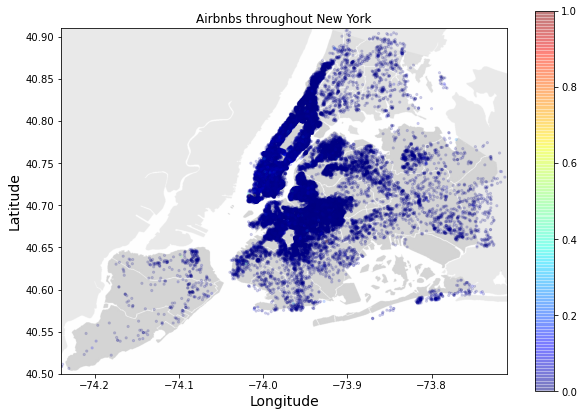

In [8]:
#code from sample to replicate map of airbnbs throughout New York
import matplotlib.image as mpimg

nyc_img=mpimg.imread('nyc.png') 
ax = airbnb.plot(kind="scatter", x="longitude", y="latitude", figsize=(10,7),
                       c="price", cmap=plt.get_cmap("jet"), colorbar = False,
                       alpha=0.15, s=5, title="Airbnbs throughout New York")

# overlay the New York image
plt.imshow(nyc_img, extent=[-74.24, -73.71, 40.50, 40.91], alpha=0.3,
           cmap=plt.get_cmap("jet"))
plt.ylabel("Latitude", fontsize=14)
plt.xlabel("Longitude", fontsize=14)

prices = airbnb["price"]
tick_values = np.linspace(prices.min(), prices.max(), 11)
cb = plt.colorbar()
#cb.ax.set_yticklabels(["$%dk"%v for v in tick_values], fontsize=14)
#cb.set_label('Price per Night', fontsize=16)

plt.show()


Now try to recreate this plot using Plotly's Scatterplot functionality. Note that the increased interactivity of the plot allows for some very cool functionality


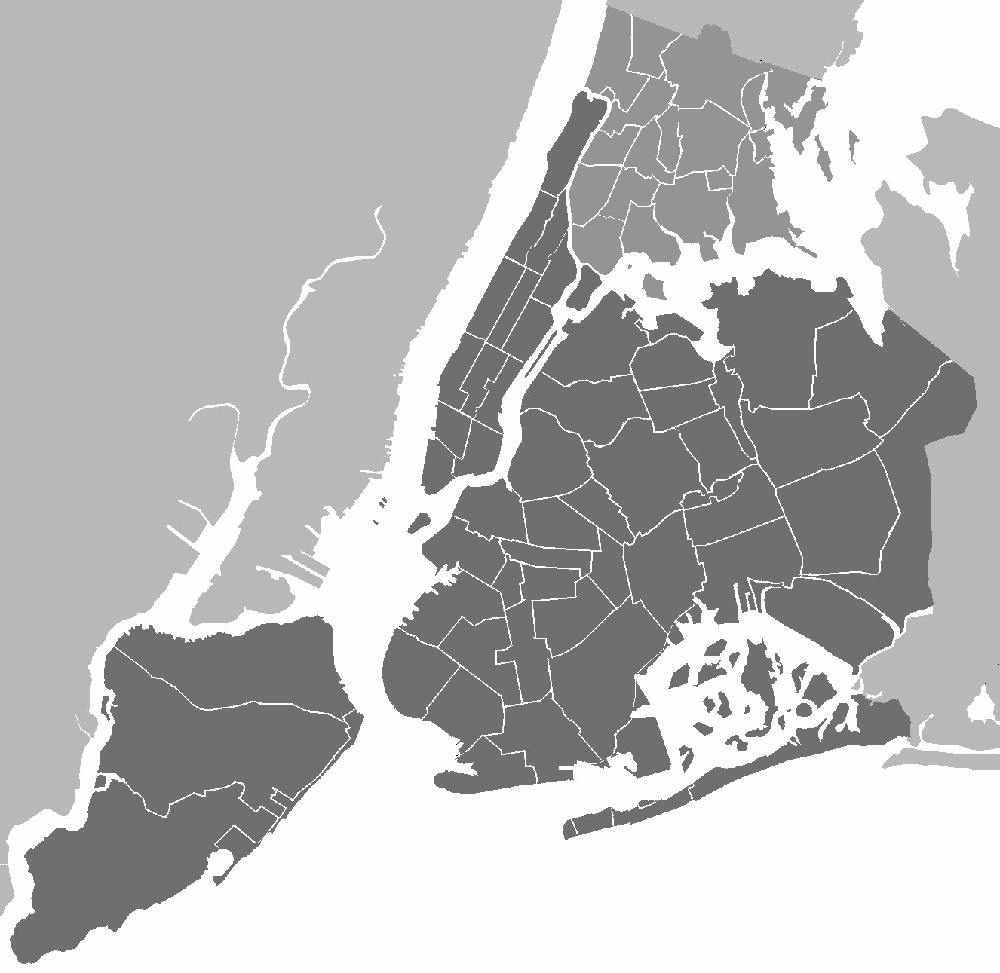

In [9]:
from PIL import Image

#plot the scatterplot
fig_ny = px.scatter(airbnb, x="longitude", y="latitude", color="room_type", 
                size='price', hover_data=['price'], width=820, height=600,
                title = "Airbnbs throughout New York")

#add the New York picture
fig_ny.add_layout_image(dict(
    source=Image.open("nyc.png"), 
    xref="x", 
    yref="y", 
    x=-74.27, #bottom left corner
    y=40.95,  #top left corner
    sizex=0.6, 
    sizey=0.5, 
    opacity=0.7, 
    sizing="stretch",
    layer="below"
))

fig_ny.show()


### Use Plotly to plot the average price of room types in Brooklyn who have at least 10 Reviews. 

Like with the previous example you'll have to do a little bit of data engineering before you actually generate the plot. 

Generally I'd recommend the following series of steps:
1. Filter the data by neighborhood group and number of reviews to arrive at the subset of data relevant to this graph.
2. Groupby the room type
3. Take the mean of the price for each roomtype group
4. FINALLY (seriously!?!?) plot the result

In [10]:
#find all the Brooklyn airbnbs
avg_rtp = airbnb.where(airbnb['neighbourhood_group'] == "Brooklyn") 

#find the airbnbs that have at least 10 reviews
avg_rtp = avg_rtp.where(avg_rtp['number_of_reviews'] > 9)

#get only Brooklyn airbnb's that have at least 10 reviews
avg_rtp = avg_rtp.dropna()
avg_rtp = avg_rtp.groupby('room_type').mean() #take the mean of the price for each room type
avg_rtp = avg_rtp.reset_index() #sets to default index


In [11]:
#plot a bar chart
fig = px.bar(avg_rtp, x='room_type',y='price')
fig.show()


# Prepare the Data

### Feature Engineering

Let's create a new binned feature, `price_cat` that will divide our dataset into quintiles (1-5) in terms of price level (you can choose the levels to assign)

Do a value count to check the distribution of values 

In [12]:
minprice = airbnb['price'].min() #find the minimum price
maxprice = airbnb['price'].max() #find the maximum price
bins = np.linspace(minprice, maxprice, 6) #5 groups, 6 edges

labels = [1, 2, 3, 4, 5] #labels for the quintiles

#create binned feature, price_cat
airbnb['price_cat'] = pd.cut(airbnb['price'], bins = bins, labels = labels, include_lowest = True)

airbnb['price_cat'].value_counts() #value count to check distribution of values

1    48809
2       54
3       16
4        9
5        7
Name: price_cat, dtype: int64

Now engineer at least one new feature.

In [13]:
#new feature, months_active, shows how long the airbnb has been running
airbnb['months_active'] = airbnb['number_of_reviews'] / airbnb['reviews_per_month']

airbnb.head()

,id,neighbourhood_group,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,price_cat,months_active
0,2539,Brooklyn,40.64749,-73.97237,Private room,149,1,9,0.21,6,365,1,42.857143
1,2595,Manhattan,40.75362,-73.98377,Entire home/apt,225,1,45,0.38,2,355,1,118.421053
2,3647,Manhattan,40.80902,-73.94190,Private room,150,3,0,NaN,1,365,1,NaN
3,3831,Brooklyn,40.68514,-73.95976,Entire home/apt,89,1,270,4.64,1,194,1,58.189655
4,5022,Manhattan,40.79851,-73.94399,Entire home/apt,80,10,9,0.10,1,0,1,90.000000


### Data Imputation

Determine if there are any null-values and if there are impute them.

In [14]:
#NaN values in both of these columns, replace with 0
airbnb['reviews_per_month']=airbnb['reviews_per_month'].fillna(0)
airbnb['months_active'] = airbnb['months_active'].fillna(0)

airbnb.head()

#changed the values to 0 because if there were NaN in "reviews_per_month", the "number_of_reviews"
#would be 0, which makes sense that there would be no reviews.
#if there was 0 reviews, then the "months_active" would also be 0, since it is also calculated
#using the "number_of_reviews" and "reviews_per_month" columns.

,id,neighbourhood_group,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,price_cat,months_active
0,2539,Brooklyn,40.64749,-73.97237,Private room,149,1,9,0.21,6,365,1,42.857143
1,2595,Manhattan,40.75362,-73.98377,Entire home/apt,225,1,45,0.38,2,355,1,118.421053
2,3647,Manhattan,40.80902,-73.94190,Private room,150,3,0,0.00,1,365,1,0.000000
3,3831,Brooklyn,40.68514,-73.95976,Entire home/apt,89,1,270,4.64,1,194,1,58.189655
4,5022,Manhattan,40.79851,-73.94399,Entire home/apt,80,10,9,0.10,1,0,1,90.000000


### Numeric Conversions

Finally, review what features in your dataset are non-numeric and convert them.

In [15]:
from sklearn.preprocessing import LabelEncoder

#creating instance of labelencoder
labelencoder = LabelEncoder()

#converting columns "neighbourhood_group" and "room_type" to numeric values
airbnb['neighbourhood_group'] = labelencoder.fit_transform(airbnb['neighbourhood_group'])
airbnb['room_type'] = labelencoder.fit_transform(airbnb['room_type'])

airbnb.head()

,id,neighbourhood_group,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,price_cat,months_active
0,2539,1,40.64749,-73.97237,1,149,1,9,0.21,6,365,1,42.857143
1,2595,2,40.75362,-73.98377,0,225,1,45,0.38,2,355,1,118.421053
2,3647,2,40.80902,-73.94190,1,150,3,0,0.00,1,365,1,0.000000
3,3831,1,40.68514,-73.95976,0,89,1,270,4.64,1,194,1,58.189655
4,5022,2,40.79851,-73.94399,0,80,10,9,0.10,1,0,1,90.000000


# Prepare data for Machine Learning

### Set aside 20% of the data as test test (80% train, 20% test).

Using our `StratifiedShuffleSplit` function example from above, let's split our data into a 80/20 Training/Testing split using `neighbourhood_group` to partition the dataset

In [16]:
from sklearn.model_selection import StratifiedShuffleSplit

#splitting data to 80% training data and 30% testing data
split = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)

#stratifying the data using neighbourhood groups, 
#to ensure data from other buroughs are included in each data set
for train_index, test_index in split.split(airbnb, airbnb["neighbourhood_group"]):
    train_set = airbnb.loc[train_index]
    test_set = airbnb.loc[test_index]

Finally, remove your labels `price` from your testing and training cohorts, and create separate label features. 

In [17]:
#dropping labels for "price" from training set
airbnb_training = train_set.drop("price", axis=1)     
airbnb_labels = train_set["price"].copy() #saving a copy of the labels

#dropping labels for "price" from testing set
airbnb_testing = test_set.drop("price", axis=1) 
airbnb_test_labels = test_set["price"].copy() #saving a copy of the labels

# Fit a model of your choice

The task is to predict the price, you could refer to the housing example on how to train and evaluate your model using **MSE**.
Provide both **test and train set MSE values**.

In [18]:
from sklearn.linear_model import LinearRegression

#fitting a linear regression model
lin_reg = LinearRegression()
lin_reg.fit(airbnb_training, airbnb_labels)

LinearRegression()

In [19]:
#trying out model on training set
data_train = airbnb_training.iloc[:5]
labels_train = airbnb_labels.iloc[:5]

print("Training Model Predictions:", lin_reg.predict(data_train))
print("Actual labels:", list(labels_train))

#trying out model on testing set
data_test = airbnb_testing.iloc[:5]
labels_test = airbnb_test_labels.iloc[:5]

print("Testing Model Predictions:", lin_reg.predict(data_test))
print("Actual labels:", list(labels_test))

Training Model Predictions: [139.76070903 219.42544807 177.59705874 216.54748827 192.4254401 ]
Actual labels: [72, 128, 200, 300, 125]
Testing Model Predictions: [118.43833913 -32.29074078 196.15401892 193.01242222 192.48198826]
Actual labels: [120, 35, 200, 75, 150]


In [20]:
from sklearn.metrics import mean_squared_error

#calculating mse value for training set
pred_train = lin_reg.predict(airbnb_training)
mse_train = mean_squared_error(airbnb_labels, pred_train)
print("Training Model MSE: ", mse_train)

#calculating mse value for testing set
pred_test = lin_reg.predict(airbnb_testing)
mse_test = mean_squared_error(airbnb_test_labels, pred_test)
print("Testing Model MSE: ", mse_test)

Training Model MSE:  15543.436323956626
Testing Model MSE:  16986.97324941213
